In [4]:
from evaluation import *
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from customized_module import *

In [5]:
model = torch.load("model_7.pth").to("cpu")
model.eval()

def get_features(name):
    def hook(model, input, output):
        features[name] = output
    return hook

model_map = {
    "layer1": model.backbone.body.layer1,
    "layer2": model.backbone.body.layer2,
    "layer3": model.backbone.body.layer3,
    "layer4": model.backbone.body.layer4,
    "fpn": model.backbone.fpn,
}

for name, layer in model_map.items():
    layer.register_forward_hook(get_features(name))
    
def visualize_layer(name, test_flag=False):
    if name == "fpn":
        FEATS = features[name]['0'][0]
    else:
        FEATS = features[name][0]
    print(len(FEATS))
    cols = 8
    for i in range(len(FEATS) // cols):
        fig, ax = plt.subplots(1, cols, figsize=(16,10))
        for j in range(cols):
            if cols * i + j < len(FEATS):
                ax[j].imshow(FEATS[cols * i + j].detach().numpy())
        plt.show()
        if test_flag:
            break

In [7]:
features = {}

# img = torch.randn((1, 3, 128, 128)).to("cpu")
img = np.array(Image.open("test.JPG"))
img = torch.unsqueeze(torch.permute(torch.Tensor(img), (2, 0, 1)), 0)

preds = model(img)

c:\Users\zheng\anaconda3\lib\site-packages\torch\functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ..\aten\src\ATen\native\TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


layer1-256


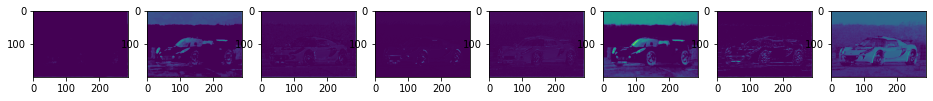

layer2-512


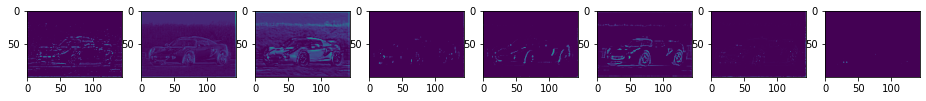

layer3-1024


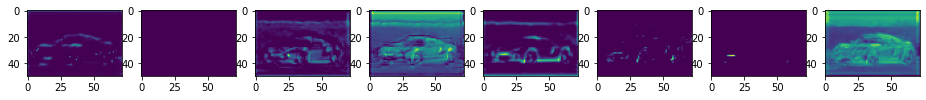

layer4-2048


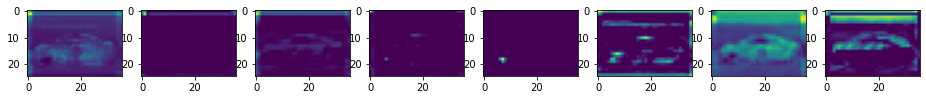

fpn-256


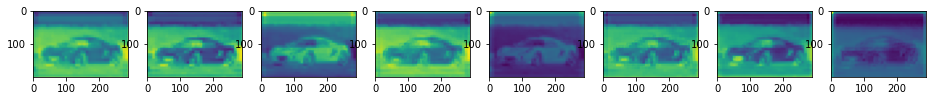

In [8]:
for layer in model_map.keys():
    print(layer, end="-")
    visualize_layer(layer, True)

256


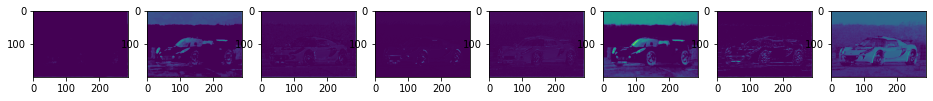

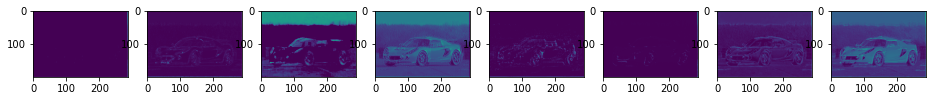

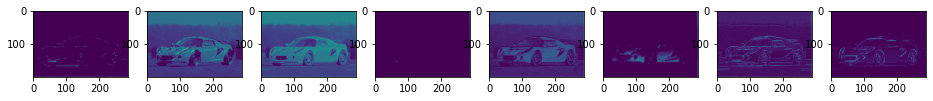

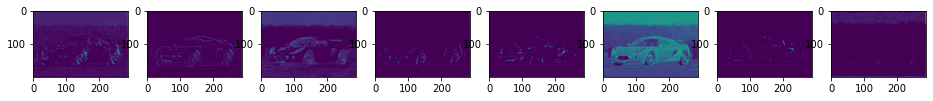

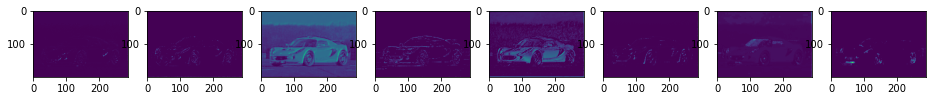

...

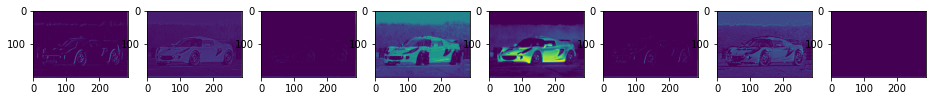

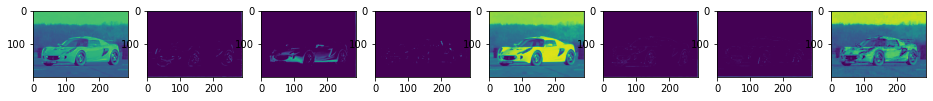

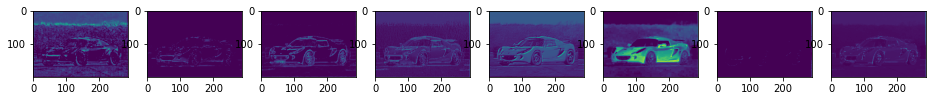

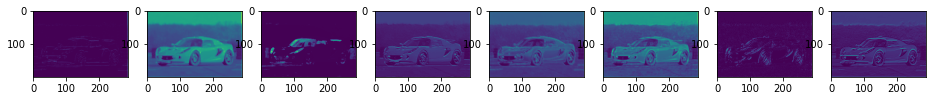

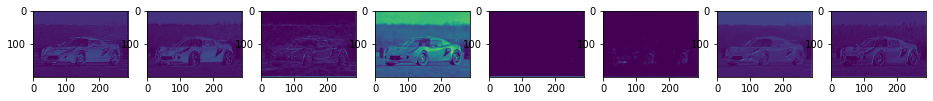

In [9]:
visualize_layer("layer1")

2048


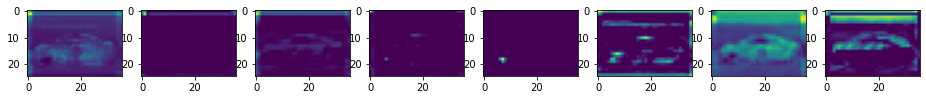

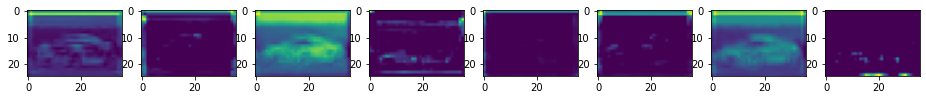

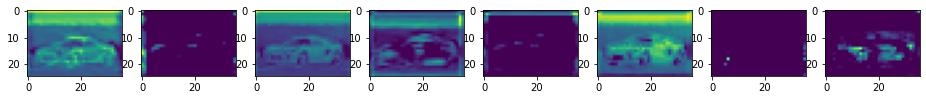

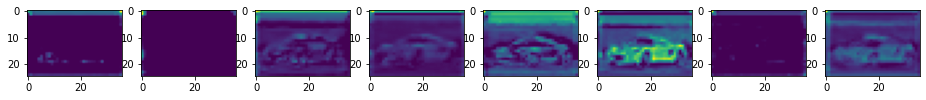

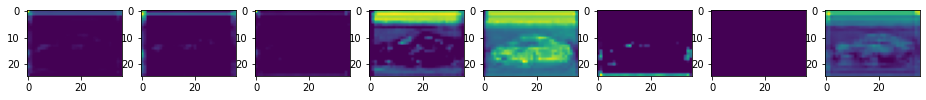

...

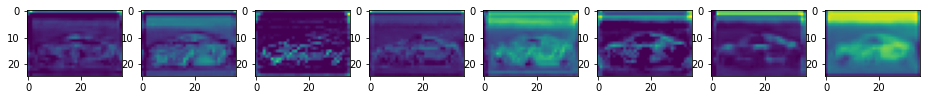

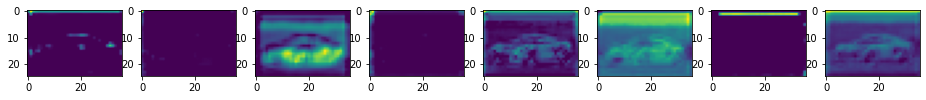

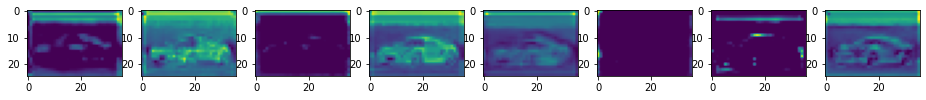

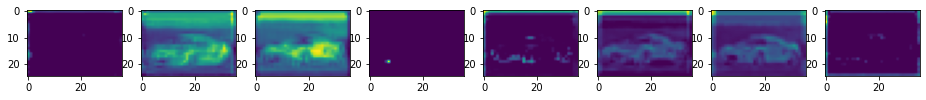

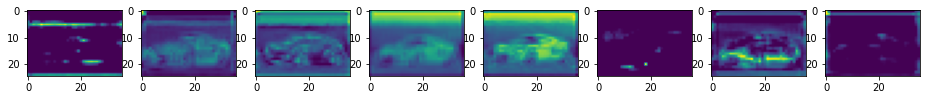

In [10]:
visualize_layer("layer4")

256


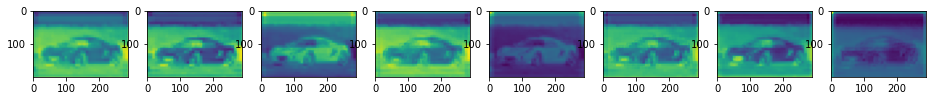

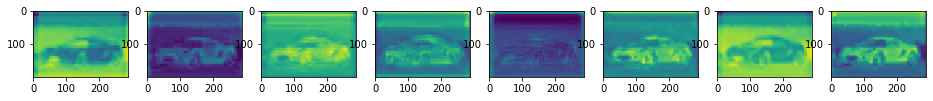

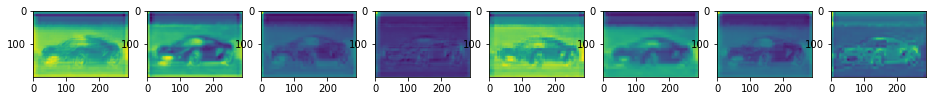

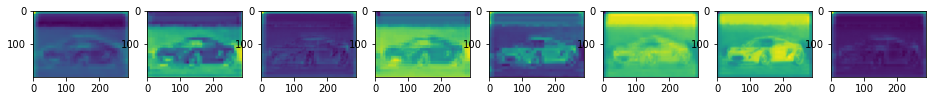

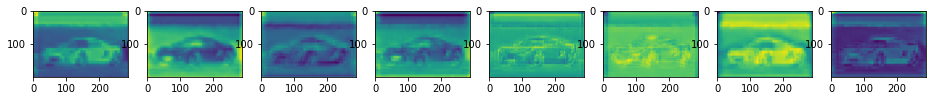

...

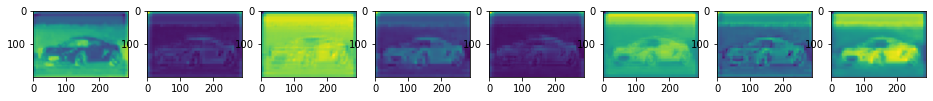

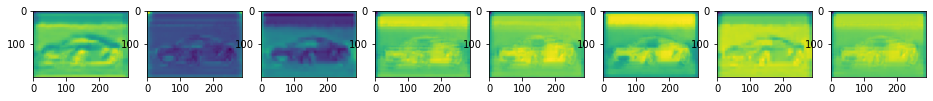

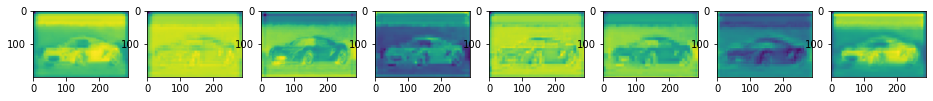

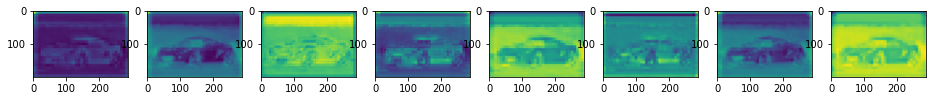

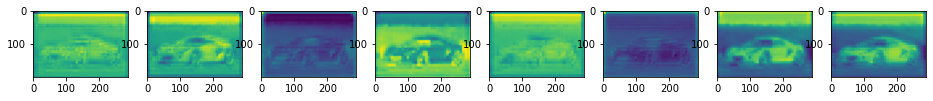

In [11]:
visualize_layer("fpn")